___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to "***Fraud Detection Project***". This is the last project of the Capstone Series.

One of the challenges in this project is the absence of domain knowledge. So without knowing what the column names are, you will only be interested in their values. The other one is the class frequencies of the target variable are quite imbalanced.

You will implement ***Logistic Regression, Random Forest, Neural Network*** algorithms and ***SMOTE*** technique. Also visualize performances of the models using ***Seaborn, Matplotlib*** and ***Yellowbrick*** in a variety of ways.

At the end of the project, you will have the opportunity to deploy your model by ***Flask API***.

Before diving into the project, please take a look at the Determines and Tasks.

- ***NOTE:*** *This tutorial assumes that you already know the basics of coding in Python and are familiar with model deployement (flask api) as well as the theory behind Logistic Regression, Random Forest, Neural Network.*



---
---


# #Determines
The datasets contains transactions made by credit cards in September 2013 by european cardholders. This dataset presents transactions that occurred in two days, where it has **492 frauds** out of **284,807** transactions. The dataset is **highly unbalanced**, the positive class (frauds) account for 0.172% of all transactions.

**Feature Information:**

**Time**: This feature is contains the seconds elapsed between each transaction and the first transaction in the dataset. 

**Amount**:  This feature is the transaction Amount, can be used for example-dependant cost-senstive learning. 

**Class**: This feature is the target variable and it takes value 1 in case of fraud and 0 otherwise.

---

The aim of this project is to predict whether a credit card transaction is fraudulent. Of course, this is not easy to do.
First of all, you need to analyze and recognize your data well in order to draw your roadmap and choose the correct arguments you will use. Accordingly, you can examine the frequency distributions of variables. You can observe variable correlations and want to explore multicollinearity. You can show the distribution of the target variable's classes over other variables. 
Also, it is useful to take missing values and outliers.

After these procedures, you can move on to the model building stage by doing the basic data pre-processing you are familiar with. 

Start with Logistic Regression and evaluate model performance. You will apply the SMOTE technique used to increase the sample for unbalanced data. Next, rebuild your Logistic Regression model with SMOTE applied data to observe its effect.

Then, you will use three different algorithms in the model building phase. You have applied Logistic Regression and Random Forest in your previous projects. However, the Deep Learning Neural Network algorithm will appear for the first time.

In the final step, you will deploy your model using ***Flask API***. 

**Optional**: You can Dockerize your project and deploy on cloud.

---
---


# #Tasks

#### 1. Exploratory Data Analysis & Data Cleaning

- Import Modules, Load Data & Data Review
- Exploratory Data Analysis
- Data Cleaning



    
#### 2. Data Preprocessing

- Scaling
- Train - Test Split


#### 3. Model Building

- Logistic Regression without SMOTE
- Apply SMOTE
- Logistic Regression with SMOTE
- Random Forest Classifier with SMOTE
- Neural Network

#### 4. Model Deployement

- Save and Export the Model as .pkl
- Save and Export Variables as .pkl 




---
---


## 1. Exploratory Data Analysis & Data Cleaning

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import tensorflow as tf
import os

# Note that the `tpu` argument is for Colab-only
resolver = tf.distribute.cluster_resolver.TPUClusterResolver(tpu='grpc://' + os.environ['COLAB_TPU_ADDR'])

tf.config.experimental_connect_to_cluster(resolver)
tf.tpu.experimental.initialize_tpu_system(resolver)
print("All devices: ", tf.config.list_logical_devices('TPU'))

INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: grpc://10.76.168.226:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.76.168.226:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


All devices:  [LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:0', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:1', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:2', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:3', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:4', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:5', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:6', device_type='TPU'), LogicalDevice(name='/job:worker/replica:0/task:0/device:TPU:7', device_type='TPU')]


### Import Modules, Load Data & Data Review

In [5]:
!pip install squarify

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import squarify


import scipy.stats as stats
import datetime as dt
from datetime import datetime

import plotly 
import plotly.express as px
import cufflinks as cf
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)


# Scaling
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures 
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler

# models
from sklearn.linear_model import LinearRegression, Lasso, Ridge, ElasticNet
from sklearn.metrics import plot_confusion_matrix, r2_score, mean_absolute_error, mean_squared_error, classification_report 
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import make_scorer, precision_score, precision_recall_curve, plot_precision_recall_curve 
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve, f1_score, accuracy_score, recall_score
from sklearn.metrics import silhouette_samples,silhouette_score
from sklearn.metrics.cluster import adjusted_rand_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold, KFold, cross_val_predict, train_test_split
from sklearn.model_selection import StratifiedKFold, GridSearchCV, cross_val_score, cross_validate
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsRegressor, KNeighborsClassifier
from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.preprocessing import scale, StandardScaler, MinMaxScaler, RobustScaler
from sklearn.preprocessing import PolynomialFeatures, OneHotEncoder, PowerTransformer, LabelEncoder 
from sklearn.svm import SVR, SVC
from sklearn.tree import plot_tree, DecisionTreeClassifier
from yellowbrick.classifier import ClassificationReport
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV

from xgboost import XGBRegressor, XGBClassifier, plot_importance

import warnings                      
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

%matplotlib inline
# %matplotlib notebook   bu notebook zorlar ancak interaktif olarak imkan sağlar.

plt.rcParams["figure.figsize"] = (10,6)   # tüm grafikleri bu ölcüye sabitledik.
# plt.rcParams['figure.dpi'] = 100

sns.set_style("whitegrid")             # çizime özel yapılabilsede gridleri beyaz yaptı.
pd.set_option('display.float_format', lambda x: '%.3f' % x)   # tüm floatları virgülden sonra 3 karakter verir.


# Figure&Display options
plt.rcParams["figure.figsize"] = (10,6)
pd.set_option('max_colwidth',200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 200)
pd.set_option('display.float_format', lambda x: '%.3f' % x)

In [7]:
df = pd.read_csv('/content/drive/MyDrive/creditcard1.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.000,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620,0
1,0.000,1.192,0.266,0.166,0.448,0.060,-0.082,-0.079,0.085,-0.255,-0.167,1.613,1.065,0.489,-0.144,0.636,0.464,-0.115,-0.183,-0.146,-0.069,-0.226,-0.639,0.101,-0.340,0.167,0.126,-0.009,0.015,2.690,0
2,1.000,-1.358,-1.340,1.773,0.380,-0.503,1.800,0.791,0.248,-1.515,0.208,0.625,0.066,0.717,-0.166,2.346,-2.890,1.110,-0.121,-2.262,0.525,0.248,0.772,0.909,-0.689,-0.328,-0.139,-0.055,-0.060,378.660,0
3,1.000,-0.966,-0.185,1.793,-0.863,-0.010,1.247,0.238,0.377,-1.387,-0.055,-0.226,0.178,0.508,-0.288,-0.631,-1.060,-0.684,1.966,-1.233,-0.208,-0.108,0.005,-0.190,-1.176,0.647,-0.222,0.063,0.061,123.500,0
4,2.000,-1.158,0.878,1.549,0.403,-0.407,0.096,0.593,-0.271,0.818,0.753,-0.823,0.538,1.346,-1.120,0.175,-0.451,-0.237,-0.038,0.803,0.409,-0.009,0.798,-0.137,0.141,-0.206,0.502,0.219,0.215,69.990,0


### Exploratory Data Analysis

In [ ]:
print("Summary of Dataset:")
#exploring the unique values of each attribute
print("Shape: ", '\n', df.shape)
print('*'*100)
print("Info: ", '\n', df.info())
print('*'*100)
print("Number of Uniques: ", '\n', df.nunique())
print('*'*100)
print('Dupplicate entries: {}'.format(df.duplicated().sum()))
print('*'*100)
print("Missing Values:", '\n', df.isnull().sum().sort_values(ascending = False))

Summary of Dataset:
Shape:  
 (284807, 31)
****************************************************************************************************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Time,284807.000,94813.860,47488.146,0.000,54201.500,84692.000,139320.500,172792.000
V1,284807.000,0.000,1.959,-56.408,-0.920,0.018,1.316,2.455
V2,284807.000,0.000,1.651,-72.716,-0.599,0.065,0.804,22.058
V3,284807.000,-0.000,1.516,-48.326,-0.890,0.180,1.027,9.383
V4,284807.000,0.000,1.416,-5.683,-0.849,-0.020,0.743,16.875
V5,284807.000,-0.000,1.380,-113.743,-0.692,-0.054,0.612,34.802
V6,284807.000,0.000,1.332,-26.161,-0.768,-0.274,0.399,73.302
V7,284807.000,-0.000,1.237,-43.557,-0.554,0.040,0.570,120.589
V8,284807.000,-0.000,1.194,-73.217,-0.209,0.022,0.327,20.007
V9,284807.000,-0.000,1.099,-13.434,-0.643,-0.051,0.597,15.595


In [ ]:
df.columns=[i.title() for i in df.columns]
df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [ ]:
def color_red(val):   
    
    if (val > 0.85 and val < 0.99) or (val > -0.85 and val < -0.99) :  
        color = 'red'
    else:
        color = 'white'
    return f'color: {color}'

pd.DataFrame(df).corr().style.applymap(color_red)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.117396,-0.010593,-0.419618,-0.105260,0.173072,-0.063016,0.084714,-0.036949,-0.008660,0.030617,-0.247689,0.124348,-0.065902,-0.098757,-0.183453,0.011903,-0.073297,0.090438,0.028975,-0.050866,0.044736,0.144059,0.051142,-0.016182,-0.233083,-0.041407,-0.005135,-0.009413,-0.010596,-0.012323
V1,0.117396,1.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.227709,-0.101347
V2,-0.010593,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.531409,0.091289
V3,-0.419618,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.210880,-0.192961
V4,-0.105260,-0.000000,-0.000000,0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.098732,0.133447
V5,0.173072,0.000000,0.000000,-0.000000,-0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.386356,-0.094974
V6,-0.063016,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.215981,-0.043643
V7,0.084714,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.397311,-0.187257
V8,-0.036949,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.103079,0.019875
V9,-0.008660,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.044246,-0.097733


In [244]:
#df.hist(bins=30, figsize=(20,20), color='b', alpha=0.6)
#plt.show()

Histogram grafiği sonuçlarına göre;

Classın binary bir yapıda olduğunu,
Time iki tepeli bir yapıda olduğunu,
Diğer featureların ise 0 etrafında bir kümelenme gösterdiğini söyleyebiliriz.

In [ ]:
print("Duplicates         : ", df.duplicated(subset = None, keep = 'first').sum())
print("Number of Uniques  : ", df["Class"].nunique())
print(df["Class"].value_counts(dropna = False))
print(f'Percentage of Class-1(Fraud): % {round(df["Class"].value_counts(normalize=True)[1]*100,2)} --> \
({df["Class"].value_counts()[1]} observations for Fraud)\nPercentage of NotFraud: % {round(df["Class"].value_counts(normalize=True)[0]*100,2)} --> ({df["Class"].value_counts()[0]} observations for NotFraud)')

Duplicates         :  1081
Number of Uniques  :  2
0    284315
1       492
Name: Class, dtype: int64
Percentage of Class-1(Fraud): % 0.17 --> (492 observations for Fraud)
Percentage of NotFraud: % 99.83 --> (284315 observations for NotFraud)


In [ ]:
df[df['Class'] == 1].describe().T.style.background_gradient(subset = ['mean','min','50%', 'max'])

,count,mean,std,min,25%,50%,75%,max
Time,492.000000,80746.806911,47835.365138,406.000000,41241.500000,75568.500000,128483.000000,170348.000000
V1,492.000000,-4.771948,6.783687,-30.552380,-6.036063,-2.342497,-0.419200,2.132386
V2,492.000000,3.623778,4.291216,-8.402154,1.188226,2.717869,4.971257,22.057729
V3,492.000000,-7.033281,7.110937,-31.103685,-8.643489,-5.075257,-2.276185,2.250210
V4,492.000000,4.542029,2.873318,-1.313275,2.373050,4.177147,6.348729,12.114672
V5,492.000000,-3.151225,5.372468,-22.105532,-4.792835,-1.522962,0.214562,11.095089
V6,492.000000,-1.397737,1.858124,-6.406267,-2.501511,-1.424616,-0.413216,6.474115
V7,492.000000,-5.568731,7.206773,-43.557242,-7.965295,-3.034402,-0.945954,5.802537
V8,492.000000,0.570636,6.797831,-41.044261,-0.195336,0.621508,1.764879,20.007208
V9,492.000000,-2.581123,2.500896,-13.434066,-3.872383,-2.208768,-0.787850,3.353525


In [ ]:
df[df['Class'] == 0].describe().T.style.background_gradient(subset = ['mean','min','50%', 'max'])

,count,mean,std,min,25%,50%,75%,max
Time,284315.000000,94838.202258,47484.015786,0.000000,54230.000000,84711.000000,139333.000000,172792.000000
V1,284315.000000,0.008258,1.929814,-56.407510,-0.917544,0.020023,1.316218,2.454930
V2,284315.000000,-0.006271,1.636146,-72.715728,-0.599473,0.064070,0.800446,18.902453
V3,284315.000000,0.012171,1.459429,-48.325589,-0.884541,0.182158,1.028372,9.382558
V4,284315.000000,-0.007860,1.399333,-5.683171,-0.850077,-0.022405,0.737624,16.875344
V5,284315.000000,0.005453,1.356952,-113.743307,-0.689398,-0.053457,0.612181,34.801666
V6,284315.000000,0.002419,1.329913,-26.160506,-0.766847,-0.273123,0.399619,73.301626
V7,284315.000000,0.009637,1.178812,-31.764946,-0.551442,0.041138,0.571019,120.589494
V8,284315.000000,-0.000987,1.161283,-73.216718,-0.208633,0.022041,0.326200,18.709255
V9,284315.000000,0.004467,1.089372,-6.290730,-0.640412,-0.049964,0.598230,15.594995


(-1.25, 1.25, -1.25, 1.25)

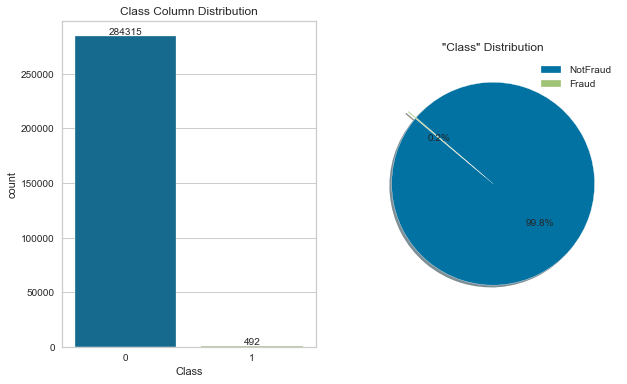

In [ ]:
plt.figure(figsize=(10,6))
plt.subplot(1,2,1)
ax = sns.countplot(x ="Class", data = df)
plt.title('Class Column Distribution')
ax.bar_label(ax.containers[0])

plt.subplot(1,2,2)
explode = [0, 0.1]
plt.pie(df['Class'].value_counts(), explode=explode, autopct='%1.1f%%', shadow=True,startangle=140)
plt.legend(labels=['NotFraud','Fraud'])
plt.title('"Class" Distribution')
plt.axis('off')

Class değerlerinin dağılımına baktığımızda datamızın inbalanced bir data olduğunu söyleyebiliriz.

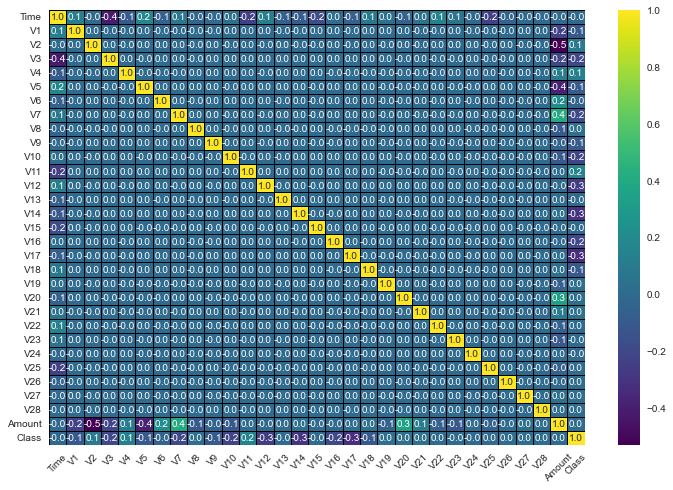

In [ ]:
plt.figure(figsize = (12, 8))
sns.heatmap (df.corr(), annot = True, fmt = '.1f', linewidths=1, linecolor="black", cmap="viridis")
plt.xticks(rotation = 45);

Coğu feature arasında kaydadeğer bir corr. olmadığını görüyoruz.

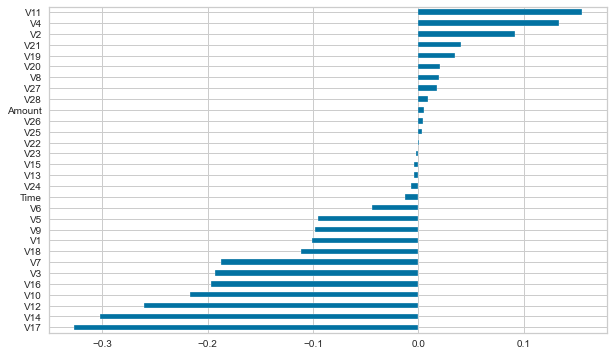

In [ ]:
df.corr()['Class'].sort_values().drop('Class').plot(kind = 'barh');

Fraud bir işlem sonrası bir veya daha fazla fraud işlem geliyor mu? 

Fraud bir işlemin miktarı genellikle gerçek bir işlemin miktarından daha mı fazla?

Fraud işlemlerinin yüksek işlem döneminde gerçekleştiğine dair herhangi bir gösterge var mı?

In [245]:
"""
plt.figure(figsize = (20, 30*10))
features = df.iloc[:,:30].columns
gs = gridspec.GridSpec(30,1)
for i, feature in enumerate(df[features]):
    ax = plt.subplot(gs[i])
    sns.distplot(df[feature][df.Class==1], bins=50)
    sns.distplot(df[feature][df.Class==0], bins=50)
    ax.set_xlabel("")
    ax.set_title("Feature:" + str(feature))
plt.show();
"""

'\nplt.figure(figsize = (20, 30*10))\nfeatures = df.iloc[:,:30].columns\ngs = gridspec.GridSpec(30,1)\nfor i, feature in enumerate(df[features]):\n    ax = plt.subplot(gs[i])\n    sns.distplot(df[feature][df.Class==1], bins=50)\n    sns.distplot(df[feature][df.Class==0], bins=50)\n    ax.set_xlabel("")\n    ax.set_title("Feature:" + str(feature))\nplt.show();\n'

### Time

In [246]:
"""
fig1 = px.histogram(df,
                   x = 'Time',
                   color="Class",
                   nbins = 200,
                   title = 'Distribution of transactions over time',
                   template = 'ggplot2'
                  )
fig1.show()
"""

'\nfig1 = px.histogram(df,\n                   x = \'Time\',\n                   color="Class",\n                   nbins = 200,\n                   title = \'Distribution of transactions over time\',\n                   template = \'ggplot2\'\n                  )\nfig1.show()\n'

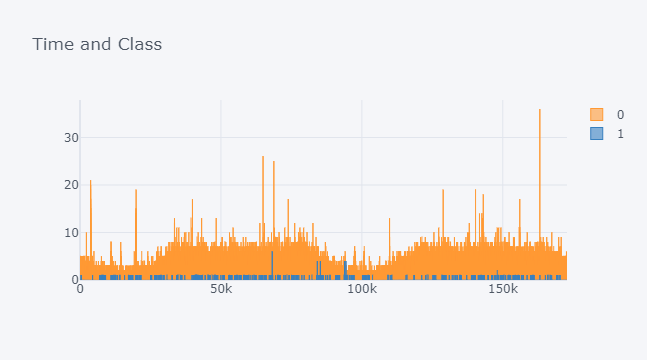

In [ ]:
pd.crosstab(df['Time'], df['Class']).iplot(kind='bar', title = 'Time and Class')

İşlem sayısı özellikle belirli zaman aralıklarında yüksek, aralarda ise düşüktür.

Belirli zaman noktalarında çok sayıda fraud işlemi olduğunu gösteren belirli ani yükselmeler vardır.

Fraud işlemlerin, geçerli işlemlerden daha eşit bir dağılıma sahip olduğunu görmekteyiz.

### Amount

In [247]:
"""
fig1 = px.histogram(df,
                   x = 'Amount',
                   color="Class",
                   nbins = 200,
                   title = 'Distribution of transactions Amount',
                   template = 'ggplot2'
                  )
fig1.show()
"""

'\nfig1 = px.histogram(df,\n                   x = \'Amount\',\n                   color="Class",\n                   nbins = 200,\n                   title = \'Distribution of transactions Amount\',\n                   template = \'ggplot2\'\n                  )\nfig1.show()\n'

Mesela amountta 5 den 10 doğru bir artış söz konusu olduğunda 5 lik bir artış % 100 lük bir artış demektir.Ancak 100 den 105 çıkınca yine 5 lik bir artış söz konusu ama değişim % 5 tir. Bu iki artış mesafe olarak aynı olmasına rağmen yüzdesel olarak aynı değildir. Bunu engellemek ve dağılımı daha iyi göstermek için bu grafiklerin bazılarında bir log dönüşümü yaptım. 

In [248]:
"""
np.seterr(divide = 'ignore')
#np.seterr(divide = 'warn')

df1 = pd.DataFrame(columns = ['Class','log_amount'])
df1['Class'] = df['Class']
df1['log_amount'] = df['Amount'].apply(np.log2)
#df1['log_amount'] = np.log2(df['Amount'])

fig1 = px.histogram(df1,
                   x = 'log_amount',
                    color="Class",
                   nbins = 200,
                   title = 'Distribution of transaction amount after log transformation',
                   #log_y = True,
                   template = 'ggplot2'
                  )
fig1.show()
"""

'\nnp.seterr(divide = \'ignore\')\n#np.seterr(divide = \'warn\')\n\ndf1 = pd.DataFrame(columns = [\'Class\',\'log_amount\'])\ndf1[\'Class\'] = df[\'Class\']\ndf1[\'log_amount\'] = df[\'Amount\'].apply(np.log2)\n#df1[\'log_amount\'] = np.log2(df[\'Amount\'])\n\nfig1 = px.histogram(df1,\n                   x = \'log_amount\',\n                    color="Class",\n                   nbins = 200,\n                   title = \'Distribution of transaction amount after log transformation\',\n                   #log_y = True,\n                   template = \'ggplot2\'\n                  )\nfig1.show()\n'

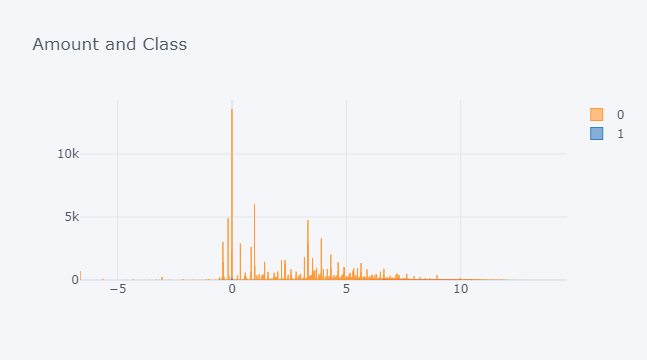

In [ ]:
pd.crosstab(df1['log_amount'], df1['Class']).iplot(kind='bar', title = 'Amount and Class')

In [ ]:
pd.DataFrame(df[df["Class"]==0]).corr().style.applymap(color_red)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.116489,-0.008408,-0.441001,-0.104329,0.172963,-0.064131,0.084172,-0.035954,-0.010577,0.027343,-0.248900,0.125597,-0.065773,-0.111185,-0.183583,0.007657,-0.092432,0.088770,0.029831,-0.050802,0.047081,0.144257,0.051167,-0.016259,-0.233290,-0.041353,-0.003859,-0.009442,-0.010634,nan
V1,0.116489,1.000000,0.022537,-0.047511,0.020927,-0.031465,-0.006405,-0.053563,0.004444,-0.018962,-0.043521,0.022628,-0.042748,0.000335,-0.039432,-0.001545,-0.036434,-0.072388,-0.025460,0.006555,0.005222,0.001542,0.000627,0.000720,0.000269,0.001181,-0.000334,-0.003843,-0.001883,-0.231250,nan
V2,-0.008408,0.022537,1.000000,0.037855,-0.018318,0.023772,0.004879,0.042034,-0.000308,0.016215,0.036616,-0.020669,0.038138,-0.000043,0.038006,0.001695,0.029876,0.057156,0.019407,-0.004332,-0.004371,-0.003208,0.000054,-0.002049,0.000359,-0.001272,-0.000171,0.002333,-0.000455,-0.536546,nan
V3,-0.441001,-0.047511,0.037855,1.000000,0.039621,-0.048840,-0.013294,-0.084853,0.012717,-0.033957,-0.077708,0.045074,-0.082218,0.000675,-0.082701,-0.002861,-0.064728,-0.123916,-0.041710,0.010916,0.009277,0.002536,0.001591,0.000592,-0.000909,0.001990,0.000621,-0.002033,-0.001536,-0.219130,nan
V4,-0.104329,0.020927,-0.018318,0.039621,1.000000,0.020792,0.007452,0.041284,-0.004830,0.019998,0.042680,-0.028149,0.050820,-0.000155,0.054611,0.001436,0.037544,0.070029,0.022579,-0.006279,-0.004627,-0.002162,-0.001545,-0.000146,0.001056,0.000022,-0.001424,-0.001003,0.000076,0.099802,nan
V5,0.172963,-0.031465,0.023772,-0.048840,0.020792,1.000000,-0.006130,-0.054119,0.010285,-0.019872,-0.046404,0.023374,-0.045660,0.001180,-0.039806,-0.001316,-0.040479,-0.081834,-0.028880,0.008482,0.005711,0.000190,0.001672,0.001603,0.000992,0.001354,-0.000432,-0.004159,-0.001932,-0.392782,nan
V6,-0.064131,-0.006405,0.004879,-0.013294,0.007452,-0.006130,1.000000,-0.010838,0.011390,-0.005735,-0.013322,0.009688,-0.017078,0.000436,-0.019693,0.000117,-0.012584,-0.023465,-0.007223,0.002360,0.001171,0.000552,0.000013,-0.002824,-0.000057,0.000848,0.000272,0.002261,0.000420,0.216433,nan
V7,0.084172,-0.053563,0.042034,-0.084853,0.041284,-0.054119,-0.010838,1.000000,-0.004257,-0.037696,-0.087096,0.045930,-0.087163,-0.000040,-0.080338,-0.003931,-0.073046,-0.141877,-0.049440,0.012917,0.011200,0.001388,0.003348,0.002671,-0.000012,-0.000794,-0.000001,-0.008393,-0.002432,0.416628,nan
V8,-0.035954,0.004444,-0.000308,0.012717,-0.004830,0.010285,0.011390,-0.004257,1.000000,0.003386,0.005664,-0.008506,0.014594,-0.004153,0.017418,-0.002189,0.012467,0.029335,0.008826,-0.005281,0.000499,0.005968,-0.000810,0.011596,-0.000932,-0.004385,-0.000716,-0.010754,0.000151,-0.106694,nan
V9,-0.010577,-0.018962,0.016215,-0.033957,0.019998,-0.019872,-0.005735,-0.037696,0.003386,1.000000,-0.038394,0.022045,-0.041040,0.000081,-0.041854,-0.001335,-0.032174,-0.062855,-0.020898,0.005567,0.005022,-0.002533,0.002909,0.000623,-0.000449,0.000250,0.001126,-0.001473,-0.000871,-0.044684,nan


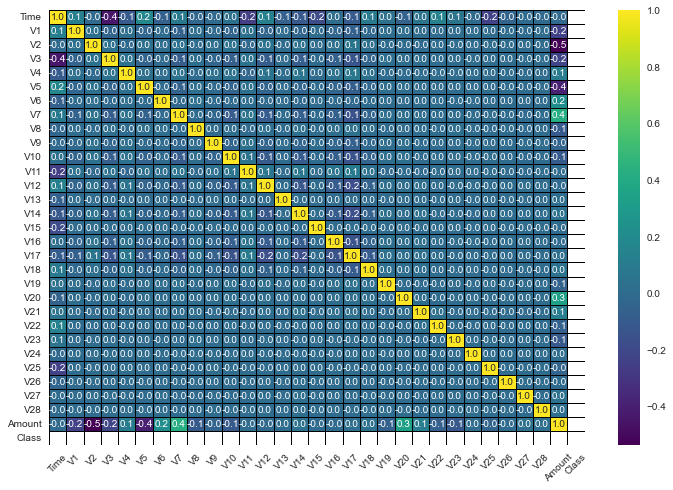

In [ ]:
plt.figure(figsize = (12, 8))
sns.heatmap (df[df["Class"]==0].corr(), annot = True, fmt = '.1f', linewidths=1, linecolor="black", cmap="viridis")
plt.xticks(rotation = 45);

In [ ]:
pd.DataFrame(df[df["Class"]==1]).corr().style.applymap(color_red)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.263358,-0.255465,0.209597,-0.196576,0.320502,0.143117,0.231853,-0.183096,0.152750,0.226530,-0.354721,0.302886,-0.165013,0.176452,-0.153736,0.275829,0.287232,0.309204,-0.087837,-0.002831,-0.068228,0.133427,0.062406,-0.025825,-0.167605,-0.042885,-0.186088,0.039952,0.048732,nan
V1,0.263358,1.000000,-0.819226,0.907875,-0.562688,0.894968,0.223961,0.897609,-0.065787,0.631848,0.710112,-0.394137,0.481558,-0.119662,0.211217,0.159328,0.555452,0.606831,0.646210,-0.257132,-0.296280,0.083158,-0.043392,-0.064715,-0.195991,-0.090328,0.133522,0.271335,0.284370,0.048216,nan
V2,-0.255465,-0.819226,1.000000,-0.876904,0.629688,-0.828391,-0.133373,-0.862983,-0.059535,-0.684573,-0.741085,0.506316,-0.571288,0.092512,-0.377940,-0.251141,-0.533731,-0.546153,-0.562368,0.129530,0.317072,-0.025126,-0.013726,0.199605,0.079638,0.139412,-0.054150,-0.254623,-0.056688,-0.272762,nan
V3,0.209597,0.907875,-0.876904,1.000000,-0.723766,0.883689,0.383930,0.882312,-0.174837,0.733208,0.818243,-0.597534,0.650644,-0.170573,0.442773,0.208485,0.617902,0.633947,0.641160,-0.245012,-0.355431,0.127262,-0.082243,-0.053028,-0.075581,-0.102828,0.033203,0.193183,0.247184,0.089994,nan
V4,-0.196576,-0.562688,0.629688,-0.723766,1.000000,-0.550242,-0.310530,-0.678238,0.099480,-0.818853,-0.726971,0.721682,-0.778764,0.196479,-0.643181,-0.212530,-0.614529,-0.605937,-0.582288,0.232063,0.306800,-0.179687,0.196026,0.056657,-0.026260,-0.086619,0.236842,-0.114434,-0.232332,-0.133795,nan
V5,0.320502,0.894968,-0.828391,0.883689,-0.550242,1.000000,0.198775,0.839738,-0.207546,0.658322,0.764589,-0.444932,0.565416,-0.213756,0.261163,0.115591,0.663324,0.723799,0.745599,-0.393706,-0.314408,0.103431,-0.112837,-0.107258,-0.290589,-0.098699,0.129076,0.249589,0.251549,-0.052031,nan
V6,0.143117,0.223961,-0.133373,0.383930,-0.310530,0.198775,1.000000,0.151266,-0.743021,0.256004,0.301981,-0.432451,0.423068,-0.237620,0.480686,-0.108935,0.331128,0.323536,0.266725,-0.181759,-0.068540,0.096851,0.004450,0.441265,-0.126380,-0.190253,-0.032648,-0.178559,-0.000370,0.228130,nan
V7,0.231853,0.897609,-0.862983,0.882312,-0.678238,0.839738,0.151266,1.000000,0.133989,0.754725,0.859823,-0.528746,0.634749,-0.073331,0.331426,0.255876,0.681391,0.703087,0.731406,-0.302068,-0.391629,0.118698,-0.146239,-0.119346,-0.156862,0.089469,0.084987,0.326955,0.245928,0.201334,nan
V8,-0.183096,-0.065787,-0.059535,-0.174837,0.099480,-0.207546,-0.743021,0.133989,1.000000,-0.058956,-0.021787,0.195576,-0.180089,0.378451,-0.223916,0.196214,-0.179295,-0.231418,-0.183130,0.238125,-0.051522,-0.124901,0.038024,-0.449208,0.125535,0.278903,0.063219,0.298508,-0.020636,0.036081,nan
V9,0.152750,0.631848,-0.684573,0.733208,-0.818853,0.658322,0.256004,0.754725,-0.058956,1.000000,0.863966,-0.612541,0.710584,-0.120863,0.525165,0.201735,0.664103,0.713887,0.697095,-0.282247,-0.437320,0.309410,-0.345583,-0.088287,-0.078098,0.012611,-0.177040,0.236227,0.275593,0.132235,nan


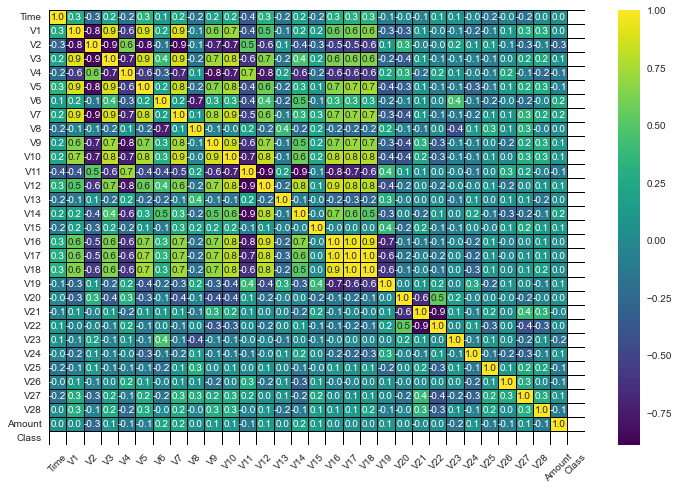

In [ ]:
plt.figure(figsize = (12, 8))
sns.heatmap (df[df["Class"]==1].corr(), annot = True, fmt = '.1f', linewidths=1, linecolor="black", cmap="viridis")
plt.xticks(rotation = 45);

Görüldüğü gibi class 0 iken yani notfraud durumunda featurelar arasında corr. değerleri çok küçük iken class 1 yani fraud durumunda bazı featurelar arasında yüksek bir corr. oluştuğunu görüyoruz.

### Data Cleaning
Check Missing Values and Outliers

In [ ]:
print("Percentage of Nulls: ", "%", round(df["Class"].isnull().sum() / df.shape[0]*100, 2))
print("Number of Nulls    : ", df["Class"].isnull().sum())

Percentage of Nulls:  % 0.0
Number of Nulls    :  0


In [ ]:
# Libraries for Style
from colorama import Fore, Style
from termcolor import colored, cprint

In [ ]:
# OUTLIERS

iqr_factor = [1.5, 2]
list1, list2 = [], []

for factor in iqr_factor:
    count = 0
    print(f'Outliers for {factor} IQR :')
    print('-------------------------------------')
    for col in df.iloc[:, [0,1,3]].columns:
    
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        lower_lim = df[col].quantile(0.25) - factor*IQR
        upper_lim = df[col].quantile(0.75) + factor*IQR
    
        cond = df[(df[col] < lower_lim) | (df[col] > upper_lim)].shape[0]
        
        if cond > 0 and factor == 2:
            list1.append(df[(df[col] < lower_lim) | (df[col] > upper_lim)].index.tolist())
        if cond > 0 and factor == 3:
            list2.append(df[(df[col] < lower_lim) | (df[col] > upper_lim)].index.tolist())
        
        if cond > 0: print(f'{col:<30} : ', cond); count += cond
    print(f'\n{Fore.BLUE}TOTAL OUTLIERS FOR {factor} IQR : {count}{Style.RESET_ALL}')
    print('')

Outliers for 1.5 IQR :
-------------------------------------
V1                             :  7062
V3                             :  3363

TOTAL OUTLIERS FOR 1.5 IQR : 10425

Outliers for 2 IQR :
-------------------------------------
V1                             :  4432
V3                             :  1816

TOTAL OUTLIERS FOR 2 IQR : 6248



---
---


## 2. Data Preprocessing

#### Scaling

In [179]:
X = df.drop("Class", axis=1)
y = df["Class"]

#### Train - Test Split

As in this case, for extremely imbalanced datasets you may want to make sure that classes are balanced across train and test data.

In [180]:
def eval_metric(model, X_train, y_train, X_test, y_test):
    
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))

In [181]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [182]:
print("Train features shape : ", X_train.shape)
print("Train target shape   : ", y_train.shape)
print("Test features shape  : ", X_test.shape)
print("Test target shape    : ", y_test.shape)

Train features shape :  (227845, 30)
Train target shape   :  (227845,)
Test features shape  :  (56962, 30)
Test target shape    :  (56962,)


---
---


## 3. Model Building
It was previously stated that you need to make class prediction with three different algorithms. As in this case, different approaches are required to obtain better performance on unbalanced data.

This dataset is severely **unbalanced** (most of the transactions are non-fraud). So the algorithms are much more likely to classify new observations to the majority class and high accuracy won't tell us anything. To address the problem of imbalanced dataset we can use undersampling and oversampling data approach techniques. Oversampling increases the number of minority class members in the training set. The advantage of oversampling is that no information from the original training set is lost unlike in undersampling, as all observations from the minority and majority classes are kept. On the other hand, it is prone to overfitting. 

There is a type of oversampling called **[SMOTE](https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/)** (Synthetic Minority Oversampling Technique), which we are going to use to make our dataset balanced. It creates synthetic points from the minority class.

- It is important that you can evaluate the effectiveness of SMOTE. For this reason, implement the Logistic Regression algorithm in two different ways, with SMOTE applied and without.

***Note***: 

- *Do not forget to import the necessary libraries and modules before starting the model building!*

- *If you are going to use the cross validation method to be more sure of the performance of your model for unbalanced data, you should make sure that the class distributions in the iterations are equal. For this case, you should use **[StratifiedKFold](https://www.analyseup.com/python-machine-learning/stratified-kfold.html)** instead of regular cross validation method.*

### Logistic Regression without SMOTE

- The steps you are going to cover for this algorithm are as follows: 

   i. Import Libraries
   
   *ii. Model Training*
   
   *iii. Prediction and Model Evaluating*
   
   *iv. Plot Precision and Recall Curve*
   
   *v. Apply and Plot StratifiedKFold*

***i. Import Libraries***

In [17]:
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

from sklearn.compose import ColumnTransformer,make_column_transformer
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import MinMaxScaler,StandardScaler,RobustScaler,OrdinalEncoder,OneHotEncoder

from sklearn.model_selection import train_test_split,cross_val_score,cross_validate,GridSearchCV

from sklearn.metrics import confusion_matrix,classification_report,plot_confusion_matrix
from sklearn.metrics import accuracy_score, f1_score,recall_score,precision_score
from sklearn.metrics import average_precision_score,precision_recall_curve,plot_precision_recall_curve

from yellowbrick.classifier import PrecisionRecallCurve
from yellowbrick.classifier import ClassPredictionError

***ii. Model Training***

In [183]:
operations = [("scaler", StandardScaler()), ("log", LogisticRegression(max_iter=10000 ,random_state=42))] # , class_weight="balanced"

In [184]:
log_model = Pipeline(steps=operations)

In [185]:
log_model.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log', LogisticRegression(max_iter=10000, random_state=42))])

***iii. Prediction and Model Evaluating***

In [186]:
y_pred = log_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.9991748885221726

In [187]:
eval_metric(log_model, X_train, y_train, X_test, y_test)

Test_Set
[[56851    13]
 [   34    64]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.83      0.65      0.73        98

    accuracy                           1.00     56962
   macro avg       0.92      0.83      0.87     56962
weighted avg       1.00      1.00      1.00     56962


Train_Set
[[227419     32]
 [   142    252]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       0.89      0.64      0.74       394

    accuracy                           1.00    227845
   macro avg       0.94      0.82      0.87    227845
weighted avg       1.00      1.00      1.00    227845



Imbalanced datasetlerinde Accuracy değeri burada bizim için iyi bir insight sağlamıyor. Çünkü baktığımızda recall değerlerinin düşük, precission scorelarının yüksek olduğunu görüyoruz. Modelimizin tahmin gücünün yüksek olduğunu ancak tahminlerinin doğruluğunun düşük olduğunu söyleyebiliriz. 

Ancak Fraud işlemlerini tespit ederken benim için precission önemli olabilir. Çünkü bunun bankaya maliyeti sadece mesaj atmak. Burada amaç recall tam tahmin etmektir. Bu durumda precission düşük olmasının çok büyük bir önemi yoktur. 

### CV

In [188]:
model = Pipeline(steps=[("scaler", StandardScaler()), ("log", LogisticRegression(max_iter=10000, random_state=42))])

scores = cross_validate(model, X_train, y_train, scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], cv=5)

df_scores = pd.DataFrame(scores, index=range(1, 6))
df_scores.mean()[2:]

test_accuracy    0.999
test_precision   0.874
test_recall      0.629
test_f1          0.731
test_roc_auc     0.977
dtype: float64

### GridSearchCV

Gridsearch te scoring olarak f1 aldığımızda class_weight=None, C= 0,18 olarak geldi. Best score, 0.74 olarak bulduk.

Gridsearch te scoring olarak recall aldığımızda class_weight=balanced, C= 0,01 olarak geldi. Best score, 0.91 olarak bulduk.

In [189]:
model = Pipeline(steps=[
    ("scaler", StandardScaler()), 
    ("log", LogisticRegression(max_iter=10000, random_state=42))
])


param_grid = {"log__penalty":["l1","l2"], "log__C": np.logspace(-1, 5, 20),
             "log__class_weight":["balanced", None]}  # "log__solver" : ["sag", "saga"]

%time log_grid_model = GridSearchCV(model, param_grid, scoring='f1', cv=5, verbose=1, n_jobs=-1).fit(X_train, y_train)

print('\n', log_grid_model.best_params_)
print('\n', log_grid_model.best_estimator_)
print('\n', 'Best Score :', log_grid_model.best_score_)

Fitting 5 folds for each of 80 candidates, totalling 400 fits
CPU times: user 12.7 s, sys: 3.43 s, total: 16.1 s
Wall time: 8min 23s

 {'log__C': 0.1, 'log__class_weight': None, 'log__penalty': 'l2'}

 Pipeline(steps=[('scaler', StandardScaler()),
                ('log',
                 LogisticRegression(C=0.1, max_iter=10000, random_state=42))])

 Best Score : 0.7324833068712849



You're evaluating "accuracy score"? Is your performance metric reflect real success? You may need to use different metrics to evaluate performance on unbalanced data. You should use **[precision and recall metrics](https://scikit-learn.org/stable/auto_examples/model_selection/plot_precision_recall.html#:~:text=The%20precision%2Drecall%20curve%20shows,a%20low%20false%20negative%20rate.)**.

***iv. Plot Precision and Recall Curve***


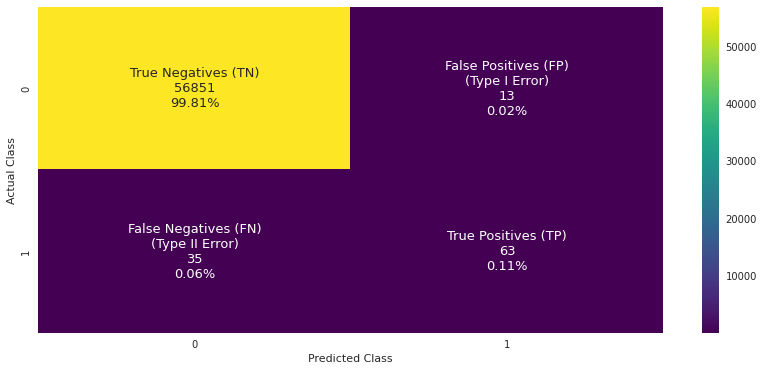

In [190]:
plt.figure(figsize=(14,6))

y_pred = log_grid_model.predict(X_test)
cf_matrix = confusion_matrix(y_test, y_pred)

group_names = ['True Negatives (TN)', 'False Positives (FP)\n(Type I Error)', 
               'False Negatives (FN)\n(Type II Error)', 'True Positives (TP)']
group_counts = ['{0:0.0f}'.format(value) for value in cf_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten()/np.sum(cf_matrix)]

labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]

labels = np.asarray(labels).reshape(2, 2)

ax = sns.heatmap(cf_matrix, annot=labels, fmt="", annot_kws={'size': 13}, cmap='viridis')
ax.set(xlabel='Predicted Class', ylabel = 'Actual Class');

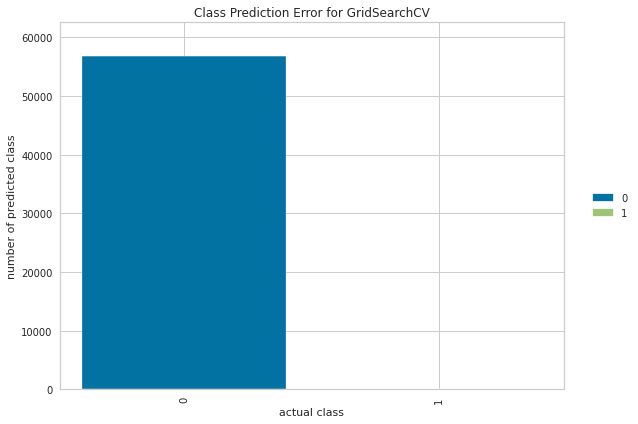

In [191]:
from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(log_grid_model)

visualizer.fit(X_train, y_train)
visualizer.score(X_test, y_test)

visualizer.poof();

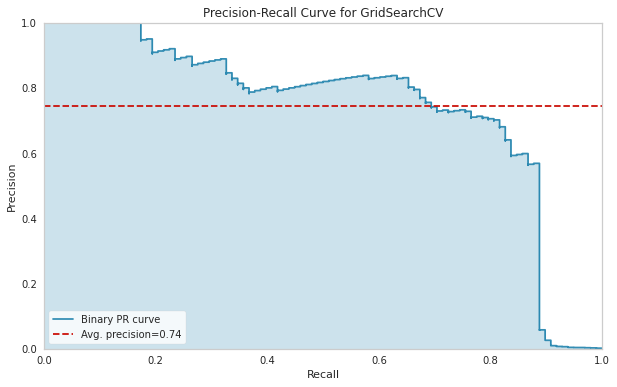

In [192]:
viz = PrecisionRecallCurve(log_grid_model)   
# plot_precision_recall_curve(log_model, X_test, y_test);

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

In [193]:
y_pred_proba = log_grid_model.predict_proba(X_test)
average_precision_score(y_test, y_pred_proba[:,1])

0.7432574905854548

In [194]:
y_pred_proba = log_grid_model.predict_proba(X_train)
average_precision_score(y_train, y_pred_proba[:,1])

0.7737562417892775

***v. Apply and Plot StratifiedKFold***

In [ ]:
!!!! önemli:
    
Burada:

threshold base log model üzerinden bulmak lazım. 

Ayrıca train datası üzerinden yapıyoruz çünkü dataleakage olmasını istemiyoruz.

In [75]:
precisions, recalls, thresholds = precision_recall_curve(y_train, y_pred_proba[:,1])

In [76]:
optimal_idx = np.argmax((2 * precisions * recalls) / (precisions + recalls))
optimal_threshold = thresholds[optimal_idx]
optimal_threshold

0.12530149929745818

In [77]:
y_pred2 = pd.Series(log_grid_model.predict_proba(X_test)[:,1]).apply(lambda x : 1 if x >= optimal_threshold else 0)

print(confusion_matrix(y_test,y_pred2))
print(classification_report(y_test,y_pred2))

[[56835    29]
 [   23    75]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.72      0.77      0.74        98

    accuracy                           1.00     56962
   macro avg       0.86      0.88      0.87     56962
weighted avg       1.00      1.00      1.00     56962



In [78]:
y_train_pred2 = pd.Series(log_grid_model.predict_proba(X_train)[:,1]).apply(lambda x : 1 if x >= optimal_threshold else 0)

print(confusion_matrix(y_train, y_train_pred2))
print(classification_report(y_train, y_train_pred2))

[[227387     64]
 [    88    306]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       0.83      0.78      0.80       394

    accuracy                           1.00    227845
   macro avg       0.91      0.89      0.90    227845
weighted avg       1.00      1.00      1.00    227845



In [79]:
from sklearn.model_selection import StratifiedKFold

def CV(n, est, X, y, optimal_threshold):
    skf = StratifiedKFold(n_splits = n, shuffle = True, random_state = 42)
    acc_scores = []
    pre_scores = []
    rec_scores = []
    f1_scores  = []
    
    X = X.reset_index(drop=True)  # modele vermeden önce model başında indeksleri sıfırlıyoruz.
    y = y.reset_index(drop=True)
    
    for train_index, test_index in skf.split(X, y): 
 # yukarıda belirlediğim indekslere göre aşağıda train ve test setlerini yeniden oluşturuyor.
        
        X_train = X.loc[train_index]
        y_train = y.loc[train_index]
        X_test = X.loc[test_index]
        y_test = y.loc[test_index]
        
        
        est = est
        est.fit(X_train, y_train)
        y_pred = est.predict(X_test)
        y_pred_proba = est.predict_proba(X_test)
             
        y_pred2 = pd.Series(y_pred_proba[:,1]).apply(lambda x : 1 if x >= optimal_threshold else 0)
        
        acc_scores.append(accuracy_score(y_test, y_pred2))
        pre_scores.append(precision_score(y_test, y_pred2, pos_label=1))
        rec_scores.append(recall_score(y_test, y_pred2, pos_label=1))
        f1_scores.append(f1_score(y_test, y_pred2, pos_label=1))
    
    print(f'Accuracy {np.mean(acc_scores)*100:>10,.2f}%  std {np.std(acc_scores)*100:.2f}%')
    print(f'Precision-1 {np.mean(pre_scores)*100:>7,.2f}%  std {np.std(pre_scores)*100:.2f}%')
    print(f'Recall-1 {np.mean(rec_scores)*100:>10,.2f}%  std {np.std(rec_scores)*100:.2f}%')
    print(f'F1_score-1 {np.mean(f1_scores)*100:>8,.2f}%  std {np.std(f1_scores)*100:.2f}%')

In [82]:
#model = Pipeline(steps=[('scaler', StandardScaler()),
#                ('log', LogisticRegression(C=0.1, class_weight='balanced',
#                                    max_iter=10000, random_state=42))])
CV(5, log_grid_model, pd.DataFrame(X_train), y_train, optimal_threshold)  

# !!! önemli: burada log grid yerine base log modeli almak lazım.

Fitting 5 folds for each of 80 candidates, totalling 400 fits
Fitting 5 folds for each of 80 candidates, totalling 400 fits
Fitting 5 folds for each of 80 candidates, totalling 400 fits
Fitting 5 folds for each of 80 candidates, totalling 400 fits
Fitting 5 folds for each of 80 candidates, totalling 400 fits
Accuracy      99.93%  std 0.01%
Precision-1   81.52%  std 4.61%
Recall-1      75.89%  std 2.35%
F1_score-1    78.53%  std 2.62%


In [83]:
skf = StratifiedKFold(n_splits = 10, shuffle = True, random_state = 42)
for train_index, test_index in skf.split(X, y):
    print(train_index, test_index)

[     0      1      2 ... 284804 284805 284806] [     7      9     35 ... 284739 284770 284778]
[     0      1      2 ... 284804 284805 284806] [     5     10     16 ... 284772 284793 284799]
[     0      3      4 ... 284804 284805 284806] [     1      2     13 ... 284774 284776 284792]
[     0      1      2 ... 284804 284805 284806] [    23     28     32 ... 284786 284797 284801]
[     1      2      3 ... 284801 284803 284805] [     0     12     20 ... 284802 284804 284806]
[     0      1      2 ... 284803 284804 284806] [     3      4      6 ... 284780 284781 284805]
[     0      1      2 ... 284804 284805 284806] [    14     27     33 ... 284790 284795 284796]
[     0      1      2 ... 284804 284805 284806] [    19     66     76 ... 284784 284788 284800]
[     0      1      2 ... 284804 284805 284806] [    11     15     22 ... 284765 284785 284789]
[     0      1      2 ... 284804 284805 284806] [    46     48     99 ... 284791 284794 284803]


In [80]:
from sklearn.metrics import matthews_corrcoef

y_pred = log_grid_model.predict(X_test)

matthews_corrcoef(y_test, y_pred)

0.7295956683443172

In [81]:
from sklearn.metrics import cohen_kappa_score

cohen_kappa_score(y_test, y_pred)

0.7237227090164879

- Didn't the performance of the model you implemented above satisfy you? If your model is biased towards the majority class and minority class recall is not sufficient, apply **SMOTE**.

SHAP

In [84]:
X = df.drop("Class", axis=1)
y = df["Class"]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [85]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [87]:
model_shap = LogisticRegression(class_weight= None, C=0.1, max_iter=10000, random_state=42)
model_shap.fit(X_train_scaled, y_train)

LogisticRegression(C=0.1, max_iter=10000, random_state=42)

In [88]:
eval_metric(model_shap, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[56851    13]
 [   35    63]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.83      0.64      0.72        98

    accuracy                           1.00     56962
   macro avg       0.91      0.82      0.86     56962
weighted avg       1.00      1.00      1.00     56962


Train_Set
[[227420     31]
 [   143    251]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       0.89      0.64      0.74       394

    accuracy                           1.00    227845
   macro avg       0.94      0.82      0.87    227845
weighted avg       1.00      1.00      1.00    227845



In [89]:
!pip install shap

Herbir model için kendi valueları üzerinden shap yapmak lazım. Çünkü birinden aldığım featurelar diğerinde çalışmayabilir.

In [90]:
import shap

In [91]:
explainer = shap.Explainer(model_shap, X_train_scaled)

shap_values = explainer.shap_values(X_test_scaled)

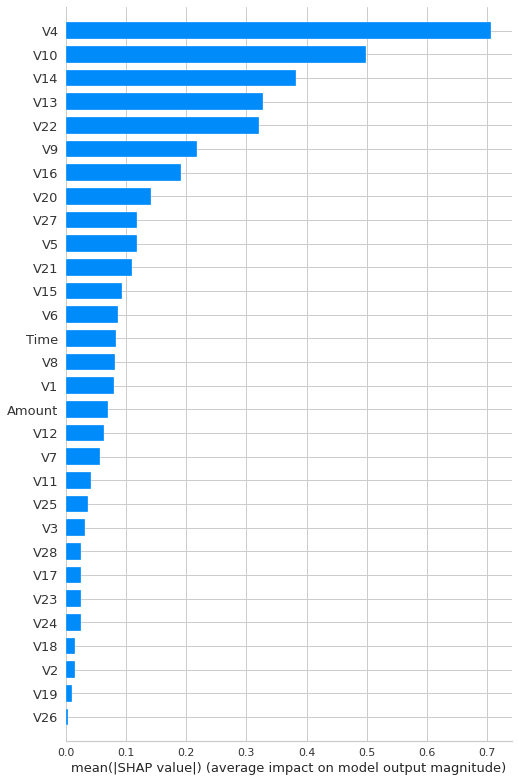

In [92]:
shap.summary_plot(shap_values, X_train_scaled, plot_type="bar",max_display=300, feature_names = X.columns)

### Apply SMOTE

In [195]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline as imbpipeline

### Logistic Regression with SMOTE

- The steps you are going to cover for this algorithm are as follows:
   
   *i. Train-Test Split (Again)*
   
   *ii. Model Training*
   
   *iii. Prediction and Model Evaluating*
   
   *iv. Plot Precision and Recall Curve*
   
   *v. Apply and Plot StratifiedKFold*

***i. Train-Test Split (Again)***

Use SMOTE applied data.

In [200]:
X = df.drop("Class", axis=1)
y = df["Class"]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)

In [201]:
over = SMOTE(random_state=42, sampling_strategy={1: 2000})
under = RandomUnderSampler(random_state=42 , sampling_strategy={0: 180000})

X_resampled_over, y_resampled_over = over.fit_resample(X_train, y_train)

In [202]:
X_resampled_under, y_resampled_under = under.fit_resample(X_train, y_train)

In [203]:
# we are configuring our pipeline steps
steps = [('o', over), ('u', under)]

# create a pipeline that will automatically apply over and under
# sampling in order to steps that we created.
pipeline = imbpipeline(steps=steps)

# we will create new data over X_train and y_train.
X_resampled, y_resampled = pipeline.fit_resample(X_train, y_train)

In [204]:
operations = [('o', over), ('u', under), ("scaler", StandardScaler()), 
              ("log", LogisticRegression(max_iter=10000, random_state=42))]  # C=0.1, class_weight=None, 

In [205]:
smote_pipeline_log = imbpipeline(steps=operations)

***ii. Model Training***

In [206]:
smote_pipeline_log.fit(X_train, y_train)

Pipeline(steps=[('o', SMOTE(random_state=42, sampling_strategy={1: 2000})),
                ('u',
                 RandomUnderSampler(random_state=42,
                                    sampling_strategy={0: 180000})),
                ('scaler', StandardScaler()),
                ('log', LogisticRegression(max_iter=10000, random_state=42))])

***iii. Prediction and Model Evaluating***

In [207]:
eval_metric(smote_pipeline_log, X_train, y_train, X_test, y_test)

Test_Set
[[56830    34]
 [   16    82]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.71      0.84      0.77        98

    accuracy                           1.00     56962
   macro avg       0.85      0.92      0.88     56962
weighted avg       1.00      1.00      1.00     56962


Train_Set
[[227373     78]
 [    75    319]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       0.80      0.81      0.81       394

    accuracy                           1.00    227845
   macro avg       0.90      0.90      0.90    227845
weighted avg       1.00      1.00      1.00    227845



In [140]:
model = smote_pipeline = imbpipeline(steps=operations)

scores = cross_validate(model, X_train, y_train, scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy    0.999
test_precision   0.805
test_recall      0.802
test_f1          0.802
test_roc_auc     0.979
dtype: float64

***iv.  Plot Precision and Recall Curve***


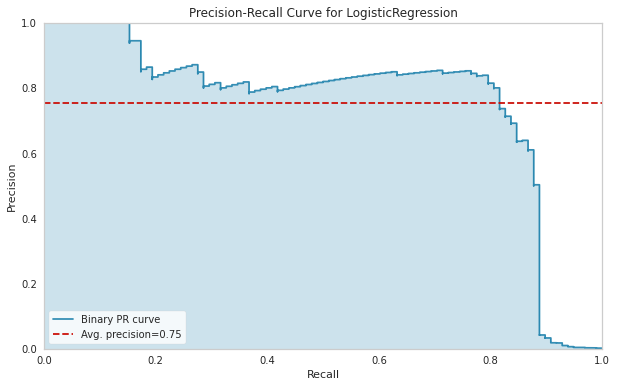

In [141]:
viz = PrecisionRecallCurve(model)   

viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz.show();

In [209]:
log_final_model = smote_pipeline_log

In [210]:
log_final_model.fit(X,y)

Pipeline(steps=[('o', SMOTE(random_state=42, sampling_strategy={1: 2000})),
                ('u',
                 RandomUnderSampler(random_state=42,
                                    sampling_strategy={0: 180000})),
                ('scaler', StandardScaler()),
                ('log', LogisticRegression(max_iter=10000, random_state=42))])

***v. Apply and Plot StratifiedKFold***

### Random Forest Classifier with SMOTE

- The steps you are going to cover for this algorithm are as follows:

   *i. Model Training*
   
   *ii. Prediction and Model Evaluating*
   
   *iii. Plot Precision and Recall Curve*
   
   *iv. Apply and Plot StratifiedKFold*
   

***i. Model Training***

In [143]:
X2 = df.drop("Class", axis=1)
y = df["Class"]

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, stratify=y, test_size=0.2, random_state=42)

In [144]:
rf_model = RandomForestClassifier(random_state=42)  # class_weight="balanced", 

In [145]:
rf_model.fit(X_train2, y_train2)

RandomForestClassifier(random_state=42)

In [146]:
eval_metric(rf_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[56859     5]
 [   18    80]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.82      0.87        98

    accuracy                           1.00     56962
   macro avg       0.97      0.91      0.94     56962
weighted avg       1.00      1.00      1.00     56962


Train_Set
[[227451      0]
 [     0    394]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       1.00      1.00      1.00       394

    accuracy                           1.00    227845
   macro avg       1.00      1.00      1.00    227845
weighted avg       1.00      1.00      1.00    227845



In [147]:
model = RandomForestClassifier(random_state=42)  # class_weight="balanced", 

scores = cross_validate(model, X_train2, y_train2, scoring = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy    0.999
test_precision   0.939
test_recall      0.759
test_f1          0.838
test_roc_auc     0.945
dtype: float64

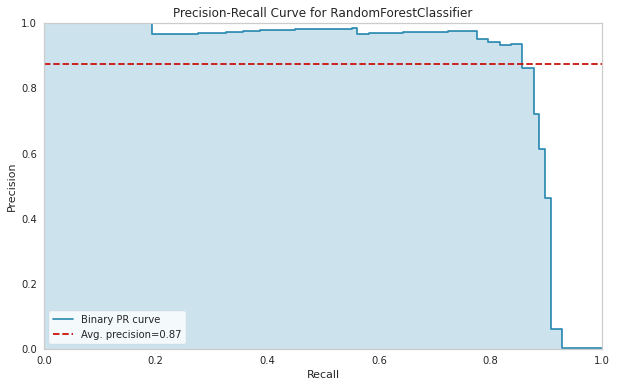

In [153]:
viz = PrecisionRecallCurve(model)   

viz.fit(X_train2, y_train2)
viz.score(X_test2, y_test2)
viz.show();

In [212]:
operations = [('o', over), ('u', under), ("scaler", StandardScaler()), 
              ("rf", RandomForestClassifier(random_state=42))]

In [213]:
smote_pipeline_rf = imbpipeline(steps=operations)

In [214]:
smote_pipeline_rf.fit(X_train2, y_train2)

Pipeline(steps=[('o', SMOTE(random_state=42, sampling_strategy={1: 2000})),
                ('u',
                 RandomUnderSampler(random_state=42,
                                    sampling_strategy={0: 180000})),
                ('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(random_state=42))])

***ii. Prediction and Model Evaluating***

In [215]:
eval_metric(smote_pipeline_rf, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[56852    12]
 [   13    85]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.88      0.87      0.87        98

    accuracy                           1.00     56962
   macro avg       0.94      0.93      0.94     56962
weighted avg       1.00      1.00      1.00     56962


Train_Set
[[227441     10]
 [     0    394]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    227451
           1       0.98      1.00      0.99       394

    accuracy                           1.00    227845
   macro avg       0.99      1.00      0.99    227845
weighted avg       1.00      1.00      1.00    227845



In [154]:
model = smote_pipeline_rf = imbpipeline(steps=operations)

scores = cross_validate(model, X_train2, y_train2, scoring=['accuracy', 'precision', 'recall', 'f1', 'roc_auc'], cv = 5)
df_scores = pd.DataFrame(scores, index = range(1, 6))
df_scores.mean()[2:]

test_accuracy    1.000
test_precision   0.897
test_recall      0.820
test_f1          0.855
test_roc_auc     0.961
dtype: float64

***iii. Plot Precision and Recall Curve***


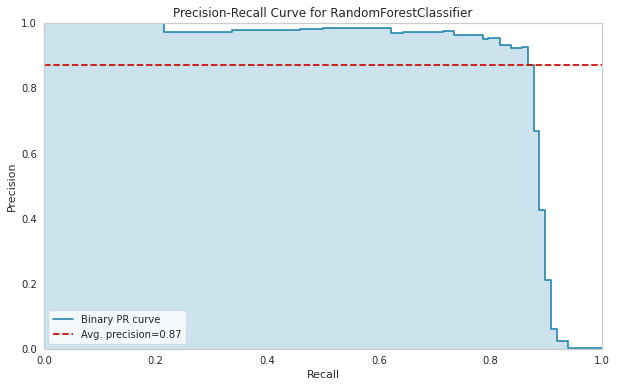

In [155]:
viz = PrecisionRecallCurve(model)   

viz.fit(X_train2, y_train2)
viz.score(X_test2, y_test2)
viz.show();

In [216]:
rf_final_model= smote_pipeline_rf

In [217]:
rf_final_model.fit(X,y)

Pipeline(steps=[('o', SMOTE(random_state=42, sampling_strategy={1: 2000})),
                ('u',
                 RandomUnderSampler(random_state=42,
                                    sampling_strategy={0: 180000})),
                ('scaler', StandardScaler()),
                ('rf', RandomForestClassifier(random_state=42))])

***iv. Apply and Plot StratifiedKFold***

### Neural Network

In the final step, you will make classification with Neural Network which is a Deep Learning algorithm. 

Neural networks are a series of algorithms that mimic the operations of a human brain to recognize relationships between vast amounts of data. They are used in a variety of applications in financial services, from forecasting and marketing research to fraud detection and risk assessment.

A neural network contains layers of interconnected nodes. Each node is a perceptron and is similar to a multiple linear regression. The perceptron feeds the signal produced by a multiple linear regression into an activation function that may be nonlinear.

In a multi-layered perceptron (MLP), perceptrons are arranged in interconnected layers. The input layer collects input patterns. The output layer has classifications or output signals to which input patterns may map. 

Hidden layers fine-tune the input weightings until the neural network’s margin of error is minimal. It is hypothesized that hidden layers extrapolate salient features in the input data that have predictive power regarding the outputs.

You will discover **[how to create](https://towardsdatascience.com/building-our-first-neural-network-in-keras-bdc8abbc17f5)** your deep learning neural network model in Python using **[Keras](https://keras.io/about/)**. Keras is a powerful and easy-to-use free open source Python library for developing and evaluating deep learning models.

- The steps you are going to cover for this algorithm are as follows:

   *i. Import Libraries*
   
   *ii. Define Model*
    
   *iii. Compile Model*
   
   *iv. Fit Model*
   
   *v. Prediction and Model Evaluating*
   
   *vi. Plot Precision and Recall Curve*

***i. Import Libraries***

In [157]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import plot_roc_curve, roc_auc_score, roc_curve
from sklearn.metrics import plot_precision_recall_curve, precision_recall_curve
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.callbacks import EarlyStopping

***ii. Define Model***

In [173]:
X3 = df.drop("Class", axis=1)
y = df["Class"]

seed = 42

In [174]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X3, y, stratify = y, test_size = 0.10, random_state = seed)

In [175]:
scaler = StandardScaler()

X_train3= scaler.fit_transform(X_train3)
X_test3 = scaler.transform(X_test3)

In [ ]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(48, activation = "relu", input_dim = X_train3.shape[1]))
model.add(Dense(24, activation = "relu"))
model.add(Dense(12, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))


***iii. Compile Model***

In [ ]:
model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = tf.keras.metrics.Recall())

In [ ]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 10)

***iv. Fit Model***

In [ ]:
model.fit(x = X_train3, y = y_train3, validation_split = 0.15, batch_size = 128, epochs = 100, verbose = 1,
          callbacks = [early_stop])

Epoch 1/100
1703/1703 [==============================] - 20s 11ms/step - loss: 0.0147 - recall_4: 0.4171 - val_loss: 0.0033 - val_recall_4: 0.7971
Epoch 2/100
1703/1703 [==============================] - 22s 13ms/step - loss: 0.0033 - recall_4: 0.7968 - val_loss: 0.0031 - val_recall_4: 0.7971
Epoch 3/100
1703/1703 [==============================] - 19s 11ms/step - loss: 0.0029 - recall_4: 0.8048 - val_loss: 0.0031 - val_recall_4: 0.7681
Epoch 4/100
1703/1703 [==============================] - 18s 11ms/step - loss: 0.0027 - recall_4: 0.8048 - val_loss: 0.0031 - val_recall_4: 0.7971
Epoch 5/100
1703/1703 [==============================] - 16s 9ms/step - loss: 0.0024 - recall_4: 0.8155 - val_loss: 0.0029 - val_recall_4: 0.7971
Epoch 6/100
1703/1703 [==============================] - 15s 9ms/step - loss: 0.0022 - recall_4: 0.8155 - val_loss: 0.0032 - val_recall_4: 0.6957
Epoch 7/100
1703/1703 [==============================] - 15s 9ms/step - loss: 0.0020 - recall_4: 0.8155 - val_loss: 0.00

***v. Prediction and Model Evaluating***

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall_4,val_loss,val_recall_4
0,0.015,0.417,0.003,0.797
1,0.003,0.797,0.003,0.797
2,0.003,0.805,0.003,0.768
3,0.003,0.805,0.003,0.797
4,0.002,0.816,0.003,0.797


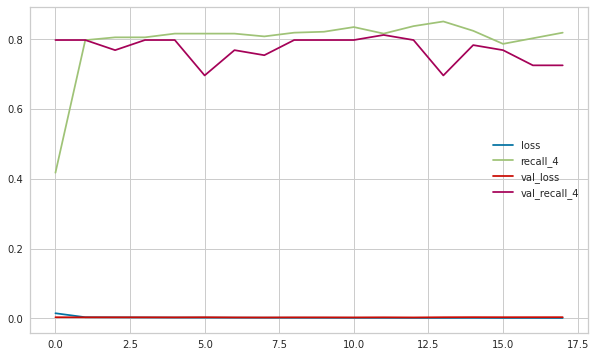

In [ ]:
loss_df.plot();

In [ ]:
loss, recall = model.evaluate(X_test3, y_test3, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.003966104704886675
recall :  0.7551020383834839


In [ ]:
y_pred = (model.predict(X_test3) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)
print(confusion_matrix(y_test3, y_pred))
print(classification_report(y_test3, y_pred))

[[28428     4]
 [   12    37]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.90      0.76      0.82        49

    accuracy                           1.00     28481
   macro avg       0.95      0.88      0.91     28481
weighted avg       1.00      1.00      1.00     28481



learning rate

In [ ]:
from tensorflow.keras.optimizers import Adam

In [ ]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(48, activation = "relu", input_dim = X_train3.shape[1]))
model.add(Dense(24, activation = "relu"))
model.add(Dense(12, activation = "relu"))
model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.005)
model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["Recall"])

In [ ]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "max", verbose = 1, patience = 10)

In [ ]:
model.fit(x = X_train3, y = y_train3, validation_split = 0.15, batch_size = 128, epochs = 100, verbose = 1,
          callbacks = [early_stop])

Epoch 1/100
1703/1703 [==============================] - 15s 8ms/step - loss: 0.0182 - recall: 0.5428 - val_loss: 0.0032 - val_recall: 0.7971
Epoch 2/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0032 - recall: 0.7834 - val_loss: 0.0030 - val_recall: 0.7971
Epoch 3/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0028 - recall: 0.8048 - val_loss: 0.0027 - val_recall: 0.7681
Epoch 4/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0025 - recall: 0.8102 - val_loss: 0.0028 - val_recall: 0.7826
Epoch 5/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0023 - recall: 0.8021 - val_loss: 0.0025 - val_recall: 0.7971
Epoch 6/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0022 - recall: 0.8048 - val_loss: 0.0025 - val_recall: 0.7826
Epoch 7/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0020 - recall: 0.8128 - val_loss: 0.0026 - val_recall: 0.7101
Epoch 

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall,val_loss,val_recall
0,0.018,0.543,0.003,0.797
1,0.003,0.783,0.003,0.797
2,0.003,0.805,0.003,0.768
3,0.003,0.810,0.003,0.783
4,0.002,0.802,0.003,0.797


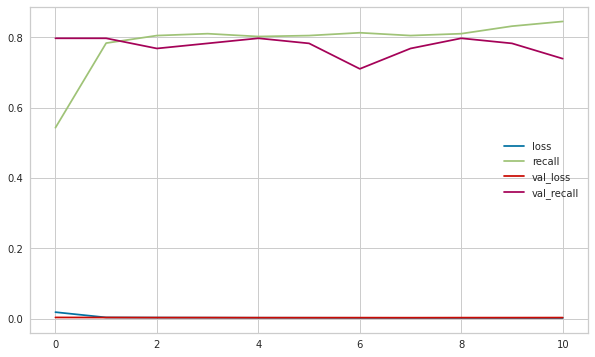

In [ ]:
loss_df.plot();

In [ ]:
loss, recall = model.evaluate(X_test3, y_test3, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.0032008711714297533
recall :  0.8367347121238708


In [ ]:
y_pred = (model.predict(X_test3) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)
print(confusion_matrix(y_test3, y_pred))
print(classification_report(y_test3, y_pred))

[[28428     4]
 [    8    41]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.91      0.84      0.87        49

    accuracy                           1.00     28481
   macro avg       0.96      0.92      0.94     28481
weighted avg       1.00      1.00      1.00     28481



Dropout

In [ ]:
from tensorflow.keras.layers import Dropout

In [ ]:
tf.random.set_seed(seed)

model = Sequential()

model.add(Dense(48, activation = "relu", input_dim = X_train3.shape[1]))
model.add(Dropout(0.5))
model.add(Dense(24, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(12, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.005)
model.compile(optimizer = "adam", loss = "binary_crossentropy", metrics = ["Recall"])

In [ ]:
model.fit(x = X_train3, y = y_train3, validation_split = 0.15, batch_size = 128, epochs = 100, verbose = 1)

Epoch 1/100
1703/1703 [==============================] - 15s 8ms/step - loss: 0.0469 - recall: 0.0856 - val_loss: 0.0065 - val_recall: 0.2754
Epoch 2/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0133 - recall: 0.1952 - val_loss: 0.0053 - val_recall: 0.3623
Epoch 3/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0104 - recall: 0.2941 - val_loss: 0.0051 - val_recall: 0.2319
Epoch 4/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0087 - recall: 0.3262 - val_loss: 0.0043 - val_recall: 0.6812
Epoch 5/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0067 - recall: 0.3690 - val_loss: 0.0043 - val_recall: 0.2464
Epoch 6/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0053 - recall: 0.3984 - val_loss: 0.0041 - val_recall: 0.7681
Epoch 7/100
1703/1703 [==============================] - 14s 8ms/step - loss: 0.0054 - recall: 0.4733 - val_loss: 0.0039 - val_recall: 0.5652
Epoch 

In [ ]:
loss_df = pd.DataFrame(model.history.history)
loss_df.head()

,loss,recall,val_loss,val_recall
0,0.047,0.086,0.006,0.275
1,0.013,0.195,0.005,0.362
2,0.010,0.294,0.005,0.232
3,0.009,0.326,0.004,0.681
4,0.007,0.369,0.004,0.246


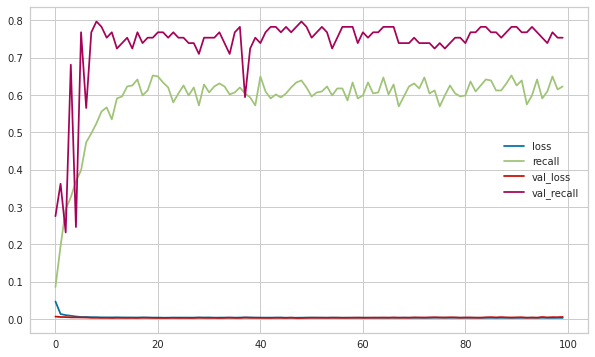

In [ ]:
loss_df.plot();

In [ ]:
loss, recall = model.evaluate(X_test3, y_test3, verbose=0)
print("loss : ", loss)
print("recall : ", recall)

loss :  0.007946466095745564
recall :  0.7142857313156128


In [ ]:
y_pred = (model.predict(X_test3) > 0.5).astype("int32")
#y_pred = model.predict_classes(X_test)
print(confusion_matrix(y_test3, y_pred))
print(classification_report(y_test3, y_pred))

[[28424     8]
 [   14    35]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.81      0.71      0.76        49

    accuracy                           1.00     28481
   macro avg       0.91      0.86      0.88     28481
weighted avg       1.00      1.00      1.00     28481



Early stop ile aldığımız scoreların learning rate ile daha da iyileştiğini gördük. Ancak dropout ise scorelarımızı bir miktar kötüleştirdi.

CV

In [ ]:
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier

In [ ]:
def build_classifier():
    classifier = Sequential()
    classifier.add(Dense(units = 48, activation = 'relu'))
    classifier.add(Dense(units = 24, activation = 'relu'))
    classifier.add(Dense(units = 12, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = "adam", loss = 'binary_crossentropy', metrics = ['Recall'])
    return classifier

In [ ]:
tf.random.set_seed(seed)

classifier_model = KerasClassifier(build_fn = build_classifier, batch_size = 128, epochs = 100, verbose=1)

scores = cross_validate(estimator = classifier_model, X = X_train3, y = y_train3,
                        scoring = ['accuracy', 'precision', 'recall', 'f1'], cv = 5)

df_scores = pd.DataFrame(scores, index = range(1, 6)).iloc[:, 2:]

df_scores

Epoch 1/100
1603/1603 [==============================] - 13s 8ms/step - loss: 0.0180 - recall: 0.5836
Epoch 2/100
1603/1603 [==============================] - 14s 8ms/step - loss: 0.0030 - recall: 0.7960
Epoch 3/100
1603/1603 [==============================] - 13s 8ms/step - loss: 0.0027 - recall: 0.7960
Epoch 4/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0023 - recall: 0.8102
Epoch 5/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0022 - recall: 0.8329
Epoch 6/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0020 - recall: 0.8244
Epoch 7/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0018 - recall: 0.8385
Epoch 8/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0017 - recall: 0.8272
Epoch 9/100
1603/1603 [==============================] - 13s 8ms/step - loss: 0.0016 - recall: 0.8385
Epoch 10/100
1603/1603 [==============================] - 12s 8ms/step - loss: 0.0

,test_accuracy,test_precision,test_recall,test_f1
1,0.999,0.910,0.678,0.777
2,0.999,0.800,0.811,0.805
3,0.999,0.886,0.772,0.825
4,1.000,0.890,0.820,0.854
5,0.999,0.899,0.798,0.845


GridsearchCV

In [162]:
from tensorflow.keras.optimizers import Adam, Adadelta, RMSprop, Nadam

In [ ]:
def build_classifier(optimizer, learn_rate):
    classifier = Sequential()
    classifier.add(Dense(units = 48, activation = 'relu'))
    classifier.add(Dense(units = 24, activation = 'relu'))
    classifier.add(Dense(units = 12, activation = 'relu'))
    classifier.add(Dense(units = 1, activation = 'sigmoid'))
    classifier.compile(optimizer = "adam", loss = 'binary_crossentropy', metrics = ['Recall'])
    return classifier

In [ ]:
early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 10)

In [ ]:
tf.random.set_seed(seed)

classifier_model = KerasClassifier(build_fn = build_classifier, validation_split = 0.1, epochs = 200)

parameters = {'batch_size': [128, 256],
              'optimizer': [Adam, RMSprop],
              'learn_rate': [0.001, 0.003, 0.005]}

grid_model = GridSearchCV(estimator = classifier_model,
                          param_grid = parameters,
                          scoring = 'recall',
                          cv = 5,
                          n_jobs = -1,
                          verbose = 1)

grid_model.fit(X_train3, y_train3, callbacks = [early_stop])

Fitting 5 folds for each of 12 candidates, totalling 60 fits
Epoch 1/200
902/902 [==============================] - 9s 9ms/step - loss: 0.0228 - recall: 0.5751 - val_loss: 0.0036 - val_recall: 0.8000
Epoch 2/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0034 - recall: 0.7888 - val_loss: 0.0034 - val_recall: 0.7400
Epoch 3/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0029 - recall: 0.7812 - val_loss: 0.0030 - val_recall: 0.7800
Epoch 4/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0026 - recall: 0.7888 - val_loss: 0.0029 - val_recall: 0.7800
Epoch 5/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0024 - recall: 0.7964 - val_loss: 0.0027 - val_recall: 0.8000
Epoch 6/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0022 - recall: 0.7837 - val_loss: 0.0029 - val_recall: 0.7600
Epoch 7/200
902/902 [==============================] - 8s 9ms/step - loss: 0.0021 - recall: 0.7761 - val_

GridSearchCV(cv=5,
             estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7f27e8c6d290>,
             n_jobs=-1,
             param_grid={'batch_size': [128, 256],
                         'learn_rate': [0.001, 0.003, 0.005],
                         'optimizer': [<class 'keras.optimizer_v2.adam.Adam'>,
                                       <class 'keras.optimizer_v2.rmsprop.RMSprop'>]},
             scoring='recall', verbose=1)

In [ ]:
grid_model.best_params_

{'batch_size': 256,
 'learn_rate': 0.001,
 'optimizer': keras.optimizer_v2.rmsprop.RMSprop}

In [ ]:
grid_result = pd.DataFrame(grid_model.cv_results_)[["mean_test_score", "std_test_score", "rank_test_score", "params"]]
grid_result.sort_values(by='rank_test_score')

,mean_test_score,std_test_score,rank_test_score,params
7,0.782,0.035,1,"{'batch_size': 256, 'learn_rate': 0.001, 'optimizer': <class 'keras.optimizer_v2.rmsprop.RMSprop'>}"
1,0.775,0.031,2,"{'batch_size': 128, 'learn_rate': 0.001, 'optimizer': <class 'keras.optimizer_v2.rmsprop.RMSprop'>}"
10,0.771,0.048,3,"{'batch_size': 256, 'learn_rate': 0.005, 'optimizer': <class 'keras.optimizer_v2.adam.Adam'>}"
11,0.762,0.060,4,"{'batch_size': 256, 'learn_rate': 0.005, 'optimizer': <class 'keras.optimizer_v2.rmsprop.RMSprop'>}"
2,0.762,0.040,5,"{'batch_size': 128, 'learn_rate': 0.003, 'optimizer': <class 'keras.optimizer_v2.adam.Adam'>}"
9,0.761,0.054,6,"{'batch_size': 256, 'learn_rate': 0.003, 'optimizer': <class 'keras.optimizer_v2.rmsprop.RMSprop'>}"
0,0.758,0.029,7,"{'batch_size': 128, 'learn_rate': 0.001, 'optimizer': <class 'keras.optimizer_v2.adam.Adam'>}"
4,0.755,0.016,8,"{'batch_size': 128, 'learn_rate': 0.005, 'optimizer': <class 'keras.optimizer_v2.adam.Adam'>}"
3,0.751,0.054,9,"{'batch_size': 128, 'learn_rate': 0.003, 'optimizer': <class 'keras.optimizer_v2.rmsprop.RMSprop'>}"
8,0.747,0.054,10,"{'batch_size': 256, 'learn_rate': 0.003, 'optimizer': <class 'keras.optimizer_v2.adam.Adam'>}"


***vi. Plot Precision and Recall Curve***

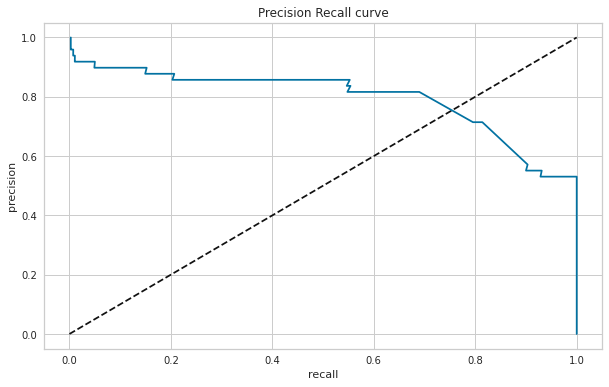

In [ ]:
y_pred_proba = model.predict(X_test3)
fpr, tpr, thresholds = precision_recall_curve(y_test3, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('Precision Recall curve')
plt.show()

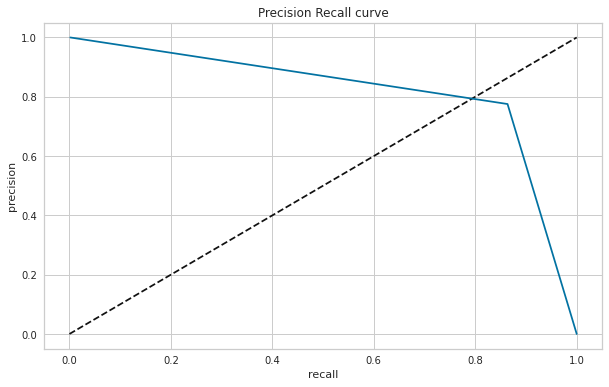

In [ ]:
y_pred_proba = grid_model.predict(X_test3)
fpr, tpr, thresholds = precision_recall_curve(y_test3, y_pred_proba)
plt.plot([0,1],[0,1],'k--')
plt.plot(fpr,tpr, label='ANN')
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('Precision Recall curve')
plt.show()

In [221]:
tf.random.set_seed(seed)

ann_final_model = Sequential()

ann_final_model.add(Dense(48, activation = "relu", input_dim = X.shape[1]))
ann_final_model.add(Dense(24, activation = "relu"))
ann_final_model.add(Dense(12, activation = "relu"))
ann_final_model.add(Dense(1, activation = "sigmoid"))

opt = Adam(lr = 0.001)

ann_final_model.compile(optimizer = "rmsprop", loss = "binary_crossentropy", metrics = ["Recall"])

early_stop = EarlyStopping(monitor = "val_loss", mode = "auto", verbose = 1, patience = 10)

ann_final_model.fit(x = X, y = y, validation_split = 0.15, batch_size = 256, epochs = 100, verbose = 1, callbacks = [early_stop])

Epoch 1/100
946/946 [==============================] - 12s 11ms/step - loss: 11.2860 - recall: 0.0318 - val_loss: 5.9950 - val_recall: 0.0000e+00
Epoch 2/100
946/946 [==============================] - 9s 10ms/step - loss: 4.7374 - recall: 0.0409 - val_loss: 0.4191 - val_recall: 0.0000e+00
Epoch 3/100
946/946 [==============================] - 9s 10ms/step - loss: 5.8603 - recall: 0.0841 - val_loss: 4.8439 - val_recall: 0.0000e+00
Epoch 4/100
946/946 [==============================] - 10s 10ms/step - loss: 5.3299 - recall: 0.0955 - val_loss: 3.1137 - val_recall: 0.0000e+00
Epoch 5/100
946/946 [==============================] - 9s 10ms/step - loss: 4.1573 - recall: 0.1409 - val_loss: 0.9884 - val_recall: 0.0000e+00
Epoch 6/100
946/946 [==============================] - 10s 10ms/step - loss: 3.1760 - recall: 0.1500 - val_loss: 2.7757 - val_recall: 0.0000e+00
Epoch 7/100
946/946 [==============================] - 9s 10ms/step - loss: 3.0854 - recall: 0.1864 - val_loss: 2.2491 - val_recall:

## 4. Model Deployement
You cooked the food in the kitchen and moved on to the serving stage. The question is how do you showcase your work to others? Model Deployement helps you showcase your work to the world and make better decisions with it. But, deploying a model can get a little tricky at times. Before deploying the model, many things such as data storage, preprocessing, model building and monitoring need to be studied.

Deployment of machine learning models, means making your models available to your other business systems. By deploying models, other systems can send data to them and get their predictions, which are in turn populated back into the company systems. Through machine learning model deployment, can begin to take full advantage of the model you built.

Data science is concerned with how to build machine learning models, which algorithm is more predictive, how to design features, and what variables to use to make the models more accurate. However, how these models are actually used is often neglected. And yet this is the most important step in the machine learning pipline. Only when a model is fully integrated with the business systems, real values ​​can be extract from its predictions.

After doing the following operations in this notebook, jump to a proper IDE and create your web app with Flask API.

### Save and Export the Model as .pkl


In [222]:
import joblib  # import pickle

In [237]:
joblib.dump(log_final_model, open('log_final_model.pkl', 'wb'))              # pickle.dump(scaler, open("scaler_fraud", 'wb'))
joblib.dump(rf_final_model, open('rf_final_model.pkl', 'wb')) 
ann_final_model.save('ann_final_model.h5')                 

joblib.dump(scaler, open("scaler_fraud.pkl", 'wb'))


In [224]:
# sample prediction
rf_final_model = joblib.load(open('rf_final_model.pkl', 'rb'))              # model_fraud = load_model('ann_model_fraud.h5')

In [225]:
scaler = joblib.load(open("scaler_fraud.pkl", "rb"))                     # scaler = pickle.load(open("scaler_fraud", "rb"))

In [226]:
single_fraud = df.drop('Class', axis = 1).iloc[0:1, :]
single_fraud

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.000,-1.360,-0.073,2.536,1.378,-0.338,0.462,0.240,0.099,0.364,0.091,-0.552,-0.618,-0.991,-0.311,1.468,-0.470,0.208,0.026,0.404,0.251,-0.018,0.278,-0.110,0.067,0.129,-0.189,0.134,-0.021,149.620


In [228]:
single_fraud = scaler.transform(single_fraud)
(rf_final_model.predict(single_fraud) > 0.5).astype("int32")

array([0], dtype=int32)

In [229]:
rf_final_model.predict(single_fraud)

array([0])

In [230]:
df["Class"].iloc[0]

0

In [231]:
sample = pd.DataFrame({
        'Time':150,
        'V1': 0.38,
        'V2': 0.53,
        'V3': 2,
        'V4': 157,
        'V5': 3,
        'V6': 0,
        'V7': 0,
        'V8': 0.38,
        'V9': 0.53,
        'V10': 2,
        'V11': 157,
        'V12': 3,
        'V13': 0,
        'V14': 0,
        'V15': 0,
        'V16': 0,
        'V17': 0.38,
        'V18': 0.53,
        'V19': 2,
        'V20': 157,
        'V21': 3,
        'V22': 0,
        'V23': 0,
        'V24': 157,
        'V25': 3,
        'V26': 0,
        'V27': 0,
        'V28': 0,
        'Amount': 150.0
}, index=[0])

sample

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,150,0.380,0.530,2,157,3,0,0,0.380,0.530,2,157,3,0,0,0,0,0.380,0.530,2,157,3,0,0,157,3,0,0,0,150.000


In [233]:
log_final_model = joblib.load(open('log_final_model.pkl', 'rb'))  

In [234]:
log_final_model.predict(sample)

array([1])

In [239]:
from tensorflow.keras.models import load_model
ann_final_model = load_model('ann_final_model.h5')

In [241]:
single_fraud = scaler.transform(sample)

In [243]:
ann_final_model.predict(single_fraud)

array([[0.]], dtype=float32)

In [242]:
(ann_final_model.predict(single_fraud) > 0.5).astype("int32")

array([[0]], dtype=int32)

### Save and Export Variables as .pkl

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___